**AI Disease Prediction**<br>
## Disease prediction using NLP
### Team Members
**Aayush Dip Giri**<br>
**Ayush Upreti**<br>
**Shiva Raj Bhatt**


## Task 
### Project Goal
The goal of this project is to analyze the drug reviews using Natural Language Processing. The project will be evaluated using both the accuracy of correct prediction and confusion matrix. There will be predictions for disease like Anxity, Birth Control, Depression, Diabetes, Type 2, etc. This will give an explanation as to how words are extracted can be used to predict the medical condition of a patient. Our group plans to use several types of analyses to help predict the medical condition based on reviews using Bag of words and TFIDF tokenizers and Naive Bayes and Passive Aggressive Classifier. 


## Dataset 

- There are total six features in the given dataset

In [1]:
import pandas as pd
import itertools
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
pd.set_option('display.max_rows', None)
pd.set_option('max_colwidth', None)


reviews = pd.read_csv('./data/drugsComTrain_raw.tsv', sep='\t').append(pd.read_csv('./data/drugsComTest_raw.tsv', sep='\t'))

<ipython-input-1-3ae7a544e7c8>:17: DtypeWarning: Columns (1,2,3,5) have mixed types. Specify dtype option on import or set low_memory=False.
  reviews = pd.read_csv('./data/drugsComTrain_raw.tsv', sep='\t').append(pd.read_csv('./data/drugsComTest_raw.tsv', sep='\t'))
<ipython-input-1-3ae7a544e7c8>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  reviews = pd.read_csv('./data/drugsComTrain_raw.tsv', sep='\t').append(pd.read_csv('./data/drugsComTest_raw.tsv', sep='\t'))


reviews.head()

In [2]:
reviews.shape

(215063, 7)

In [3]:
reviews = reviews.drop(columns=["Unnamed: 0"])

## EDA,  Preprocessing and  Cleaning

In [4]:
reviews.head()

,drugName,condition,review,rating,date,usefulCount
0,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil""",9.0,20-May-12,27.0
1,Guanfacine,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective.""",8.0,27-Apr-10,192.0
2,Lybrel,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.""",5.0,14-Dec-09,17.0
3,Ortho Evra,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch""",8.0,3-Nov-15,10.0
4,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin.""",9.0,27-Nov-16,37.0


In [5]:
# some statastics
reviews.describe()

,rating,usefulCount
count,10772.000000,10772.000000
mean,6.988489,28.130245
std,3.268684,41.838212
min,1.000000,0.000000
25%,4.000000,6.000000
50%,8.000000,15.000000
75%,10.000000,36.000000
max,10.000000,1291.000000


In [6]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 215063 entries, 0 to 53765
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   drugName     10772 non-null  object 
 1   condition    10706 non-null  object 
 2   review       10772 non-null  object 
 3   rating       10772 non-null  float64
 4   date         10772 non-null  object 
 5   usefulCount  10772 non-null  float64
dtypes: float64(2), object(4)
memory usage: 11.5+ MB


**Note: As there are no missing values, we do not need to deal with that.**

In [7]:
reviews['rating'].value_counts()

10.0    3399
9.0     1859
1.0     1407
8.0     1226
7.0      617
5.0      556
2.0      485
3.0      451
6.0      417
4.0      355
Name: rating, dtype: int64

In [8]:
reviews['drugName'].value_counts().head(10)

Levonorgestrel                        254
Etonogestrel                          235
Ethinyl estradiol / norethindrone     179
Ethinyl estradiol / norgestimate      140
Ethinyl estradiol / levonorgestrel    135
Nexplanon                             123
Sertraline                             93
Phentermine                            92
Escitalopram                           79
Venlafaxine                            79
Name: drugName, dtype: int64

In [9]:
reviews['condition'].value_counts().head(1000)

Birth Control                                                     1919
Depression                                                         646
Pain                                                               428
Acne                                                               379
Anxiety                                                            357
Bipolar Disorde                                                    275
Insomnia                                                           241
Weight Loss                                                        240
ADHD                                                               225
Obesity                                                            221
Emergency Contraception                                            184
Diabetes, Type 2                                                   176
High Blood Pressure                                                147
Vaginal Yeast Infection                                            146
Abnorm

**These disease are obtained from the training dataset for our model**

In [10]:
pred_conditions =['Birth Control', 'Depression', 'Pain', 'Acne', 'Anxiety', 'Insomnia', 'Weight Loss', 'ADHD', 'Obesity', 'Emergency Contraception', 'High Blood Pressure', 'Bowel Preparation', 'Migraine', 'Smoking Cessation', 'Urinary Tract Infection', 'Constipation', 'Chronic Pain','Osteoarthritis', 'Muscle Spasm','Opiate Dependence', 'Irritable Bowel Syndrome', 'Allergic Rhinitis', 'Sinusitis', 'GERD', 'Rheumatoid Arthritis', 'Restless Legs Syndrome', 'Cough', 'Hyperhidrosis', 'High Cholesterol', 'Back Pain', 'Bronchitis', 'Hepatitis C', 'Rosacea', 'Schizophrenia', 'Psoriasis', 'Multiple Sclerosis', 'Endometriosis', 'Benign Prostatic Hyperplasia', 'Bacterial Vaginitis', 'Chlamydia Infection', 'Headache', 'Seizures', 'Influenza', 'Atrial Fibrillation', 'Epilepsy', 'Asthma', 'Skin or Soft Tissue Infection', 'Pneumonia', 'Alcohol Dependence', 'Postmenopausal Symptoms', 'Underactive Thyroid', 'Osteoporosis', 'Anesthesia', 'Inflammatory Conditions', 'Opiate Withdrawal', 'Psoriatic Arthritis', 'Menstrual Disorders', 'Ulcerative Colitis', 'Nasal Congestion', 'Polycystic Ovary Syndrome', 'Upper Respiratory Tract Infection', 'Bacterial Skin Infection', 'Otitis Media', 'Urinary Incontinence', 'Eczema', 'Helicobacter Pylori Infection', 'Trigeminal Neuralgia', 'Ovarian Cysts', 'Diverticulitis', 'Keratosis', 'Deep Vein Thrombosis', 'Sciatica', 'Benign Essential Trem', 'COPD', 'Allergies', 'Diarrhea', 'Ankylosing Spondylitis', 'Hypertriglyceridemia', 'Postherpetic Neuralgia', 'Dry Skin', 'Light Sedation', 'Hypersomnia', 'Dysuria', 'Edema', 'Chronic Fatigue Syndrome', 'Alcohol Withdrawal', 'Dry Eye Disease', 'Autism', 'Postoperative Pain', 'Dental Abscess', 'Peripheral Neuropathy', 'Alopecia', 'Cluster Headaches', 'Muscle Pain', 'Dermatitis', 'Allergic Reactions', 'Kidney Infections', 'Rhinitis', 'Human Papilloma Virus', 'Menorrhagia', 'Prostatitis', 'Amenorrhea', 'Urinary Tract Stones', 'Seasonal Allergic Conjunctivitis', 'Basal Cell Carcinoma', 'Erosive Esophagitis', 'Strep Throat', 'Reflex Sympathetic Dystrophy Syndrome', 'Left Ventricular Dysfunction', 'Giardiasis', 'Uterine Fibroids', 'Uveitis', 'Psychosis', 'Supraventricular Tachycardia', 'Indigestion', 'Oral Thrush', 'Hemorrhoids', 'Constipation', 'Vitamin D Deficiency', 'TSH Suppression', 'Heart Attack', 'Nocturnal Leg Cramps', 'Hirsutism', 'Mitral Valve Prolapse', 'Malaria', 'Tinnitus', 'Undifferentiated Connective Tissue Disease', 'Bursitis', 'Pharyngitis', 'Diaper Rash', 'Trichotillomania', 'Gastroenteritis', 'Progesterone Insufficiency', 'Angina', 'Anorexia', 'Warts', 'Opioid Overdose', 'Conjunctivitis', 'Dermatological Disorders', 'Night Terrors', 'Clostridial Infection', 'Dermatomyositis']

In [11]:
reviews = reviews[reviews['condition'].isin(pred_conditions)]

In [12]:
reviews.condition.value_counts()

Birth Control                                 1919
Depression                                     646
Pain                                           428
Acne                                           379
Anxiety                                        357
Insomnia                                       241
Weight Loss                                    240
ADHD                                           225
Obesity                                        221
Emergency Contraception                        184
High Blood Pressure                            147
Bowel Preparation                              117
Migraine                                       114
Smoking Cessation                              109
Urinary Tract Infection                        102
Constipation                                    97
Chronic Pain                                    94
Osteoarthritis                                  83
Muscle Spasm                                    72
Opiate Dependence              

In [13]:
reviews.shape

(7662, 6)

**As we are using NLP to predict, we will be only considering the reviews and condition columns required to predict.**

In [14]:
unnecessary_columns = ['drugName','rating','date','usefulCount']

In [15]:
df = reviews.drop(columns=unnecessary_columns)

In [16]:
df.head()

,condition,review
0,Left Ventricular Dysfunction,"""It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil"""
1,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective."""
2,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."""
3,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch"""
4,Opiate Dependence,"""Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin."""


**As these reviews are extracted from a website, there can be many unnecessary characters, web tags, spaces, letters, special characters, which we need to remove to make the dataset clean.**

In [17]:
df['review'][2]

2    "I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."
2                                                                                                                                                                                                                                            

**Removing unnecessary quotes from all the columns.**

In [18]:
for column in df.columns.to_list():
    df[column] = df[column].apply(lambda x: x.replace('"', ''))

In [19]:
df['review'][2]

2    I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.
2                                                                                                                                                                                                                                              

**Removing stop words **<br>


In [20]:
import nltk
# nltk.download('stopwords')
from nltk.corpus import stopwords
import ssl

try:
    _create_unverified_https_context = ssl._create_unverified_context
except AttributeError:
    pass
else:
    ssl._create_default_https_context = _create_unverified_https_context



stops = set(stopwords.words('english'))
print(stops)

{'against', 'those', 'my', 'as', 'herself', 'were', 'over', 'your', "isn't", 'such', 'why', 'off', 'these', 'if', 'between', 'some', 'for', 'have', 'hers', 'wouldn', 'can', 'won', 'of', "it's", 'his', 'too', 'wasn', "that'll", 't', 'ma', "don't", 'mustn', 'and', 'themselves', "hasn't", 'does', 'more', 'below', 'himself', 'out', 'hadn', 'other', 'm', 'after', 'don', 'which', 's', 'ours', "doesn't", 'whom', 'while', 'up', "you'll", 'what', 'same', 'not', 'ourselves', 'yourself', 'they', 'this', 'doing', 'down', 'yours', 'with', 'she', 'is', 'how', "shan't", 'all', 'an', 'a', "she's", 'under', 'didn', 'hasn', 'own', 'had', 'the', 'here', 'then', 'll', 'we', 'into', 'doesn', "shouldn't", 'theirs', 'our', 'did', 'are', 'each', 'has', 'shan', "you've", 'them', 'about', "weren't", 'only', 'him', 'should', 'yourselves', 'shouldn', 'when', 'that', 'by', 'mightn', 'again', 'who', 'to', "haven't", 'no', 'or', "hadn't", 'do', 'd', 'aren', 'am', 're', "mustn't", 'very', "couldn't", "aren't", 'there

In [21]:
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer

stem = PorterStemmer()

lem = WordNetLemmatizer()


**HTML tag removal.**

In [22]:
from bs4 import BeautifulSoup as bs
def removeHtmlTags(review):
    return bs(review, 'html.parser').get_text()

In [23]:
df['review_cleaned'] = df['review'].apply(removeHtmlTags)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/bs4/__init__.py:435: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  warnings.warn(


In [24]:
df.head()

,condition,review,review_cleaned
0,Left Ventricular Dysfunction,"It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil","It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil"
1,ADHD,"My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective.","My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective."
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.","I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it's the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn't have any other side effects. The idea of being period free was so tempting... Alas."
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch","This is my first time using any form of birth control. I'm glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max als

In [25]:
import re
df['review_cleaned'] = df['review_cleaned'].apply(lambda x: re.sub('[^a-zA-Z]', " ", x))

In [26]:
df.head()

,condition,review,review_cleaned
0,Left Ventricular Dysfunction,"It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil",It has no side effect I take it in combination of Bystolic Mg and Fish Oil
1,ADHD,"My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective.",My son is halfway through his fourth week of Intuniv We became concerned when he began this last week when he started taking the highest dose he will be on For two days he could hardly get out of bed was very cranky and slept for nearly hours on a drive home from school vacation very unusual for him I called his doctor on Monday morning and she said to stick it out a few days See how he did at school and with getting up in the morning The last two days have been problem free He is MUCH more agreeable than ever He is less emotional a good thing less cranky He is remembering all the things he should Overall his behavior is better We have tried many different medications and so far this is the most effective
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.",I used to take another oral contraceptive which had pill cycle and was very happy very light periods max days no other side effects But it contained hormone gestodene which is not available in US so I switched to Lybrel because the ingredients are similar When my other pills ended I started Lybrel immediately on my first day of period as the instructions said And the period lasted for two weeks When taking the second pack same two weeks And now with third pack things got even worse my third period lasted for two weeks and now it s the end of the third week I still have daily brown discharge The positive side is that I didn t have any other side effects The idea of being period free was so tempting Alas
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch",This is my first time using any form of birth control I m glad I went with the patch I have been on it for months At first It decreased my libido but that subsided The only downside is that it made my periods longer days to be exact I used to only have periods for days max also made my cramps intense for the first two days of my period I never had cramps before 

**Removing the stopwords from reviews and making it lemmatized words to that only meaningful words should be present in the reviews.**

In [27]:
def removeStop(x):
    ws = x.lower().split()
    removed_stop = [w for w in ws if w not in stops]
    lem_words = [lem.lemmatize(wrd) for wrd in removed_stop]
    return " ".join(lem_words)

In [28]:
df['review_cleaned'] = df['review_cleaned'].apply(removeStop)

In [29]:
df.head()

,condition,review,review_cleaned
0,Left Ventricular Dysfunction,"It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil",side effect take combination bystolic mg fish oil
1,ADHD,"My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective.",son halfway fourth week intuniv became concerned began last week started taking highest dose two day could hardly get bed cranky slept nearly hour drive home school vacation unusual called doctor monday morning said stick day see school getting morning last two day problem free much agreeable ever le emotional good thing le cranky remembering thing overall behavior better tried many different medication far effective
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.",used take another oral contraceptive pill cycle happy light period max day side effect contained hormone gestodene available u switched lybrel ingredient similar pill ended started lybrel immediately first day period instruction said period lasted two week taking second pack two week third pack thing got even worse third period lasted two week end third week still daily brown discharge positive side side effect idea period free tempting ala
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch",first time using form birth control glad went patch month first decreased libido subsided downside made period longer day exact used period day max also made cramp intense first two day period never cramp using birth control happy patch
4,Opiate Dependence,"Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spen

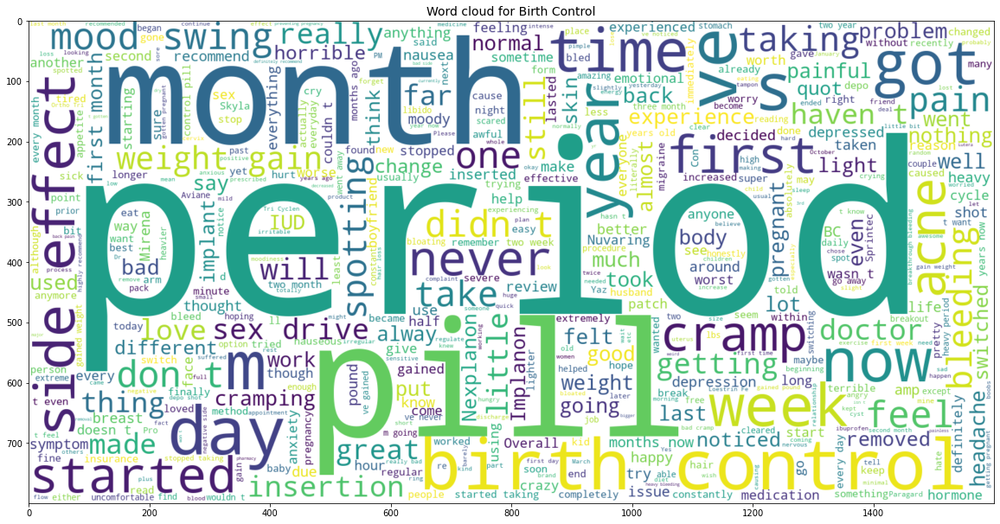

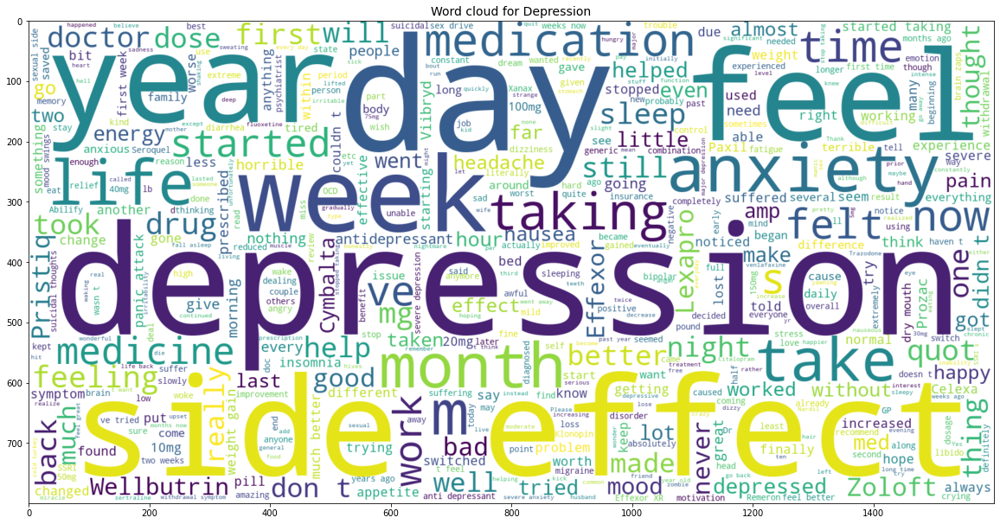

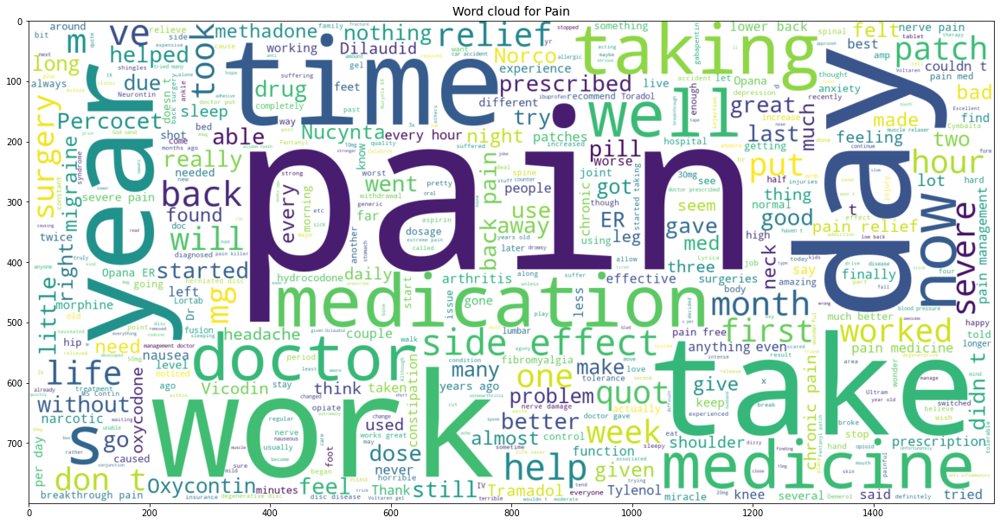

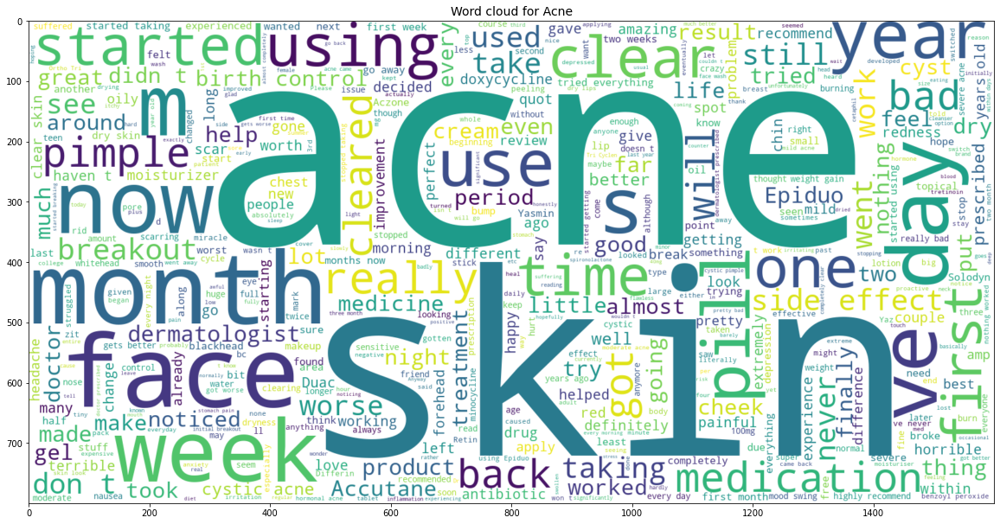

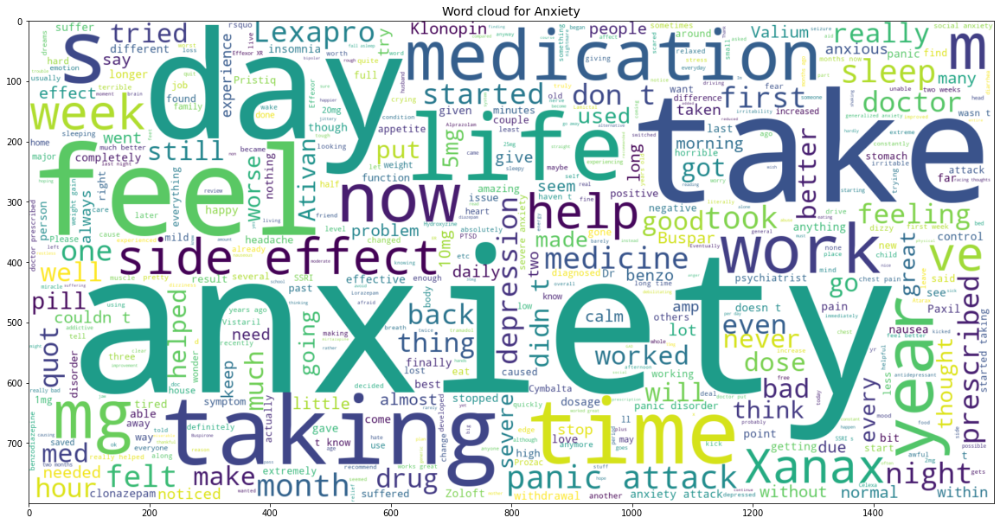

...

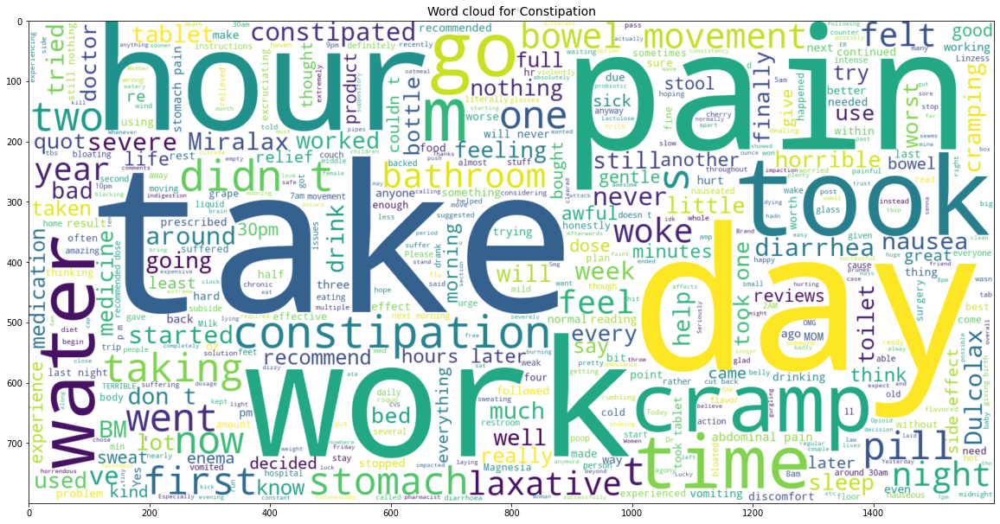

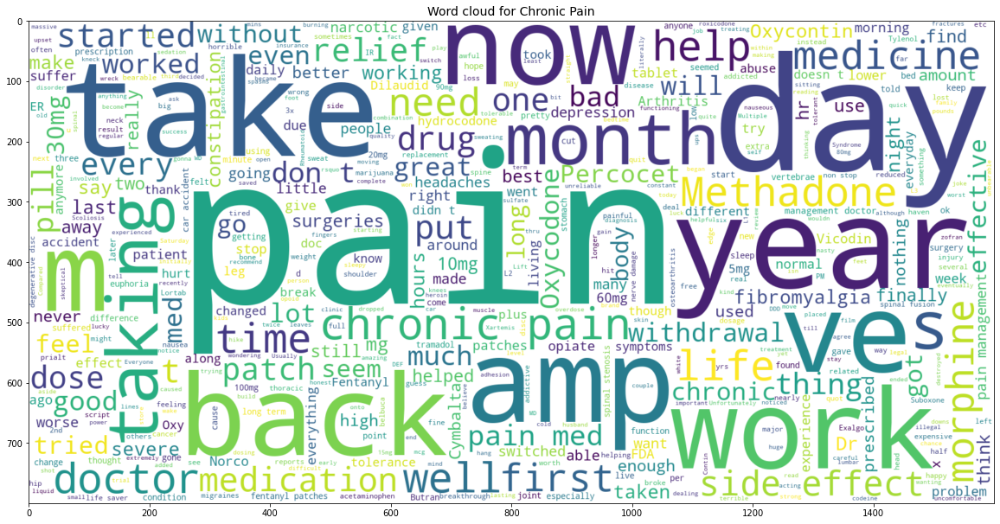

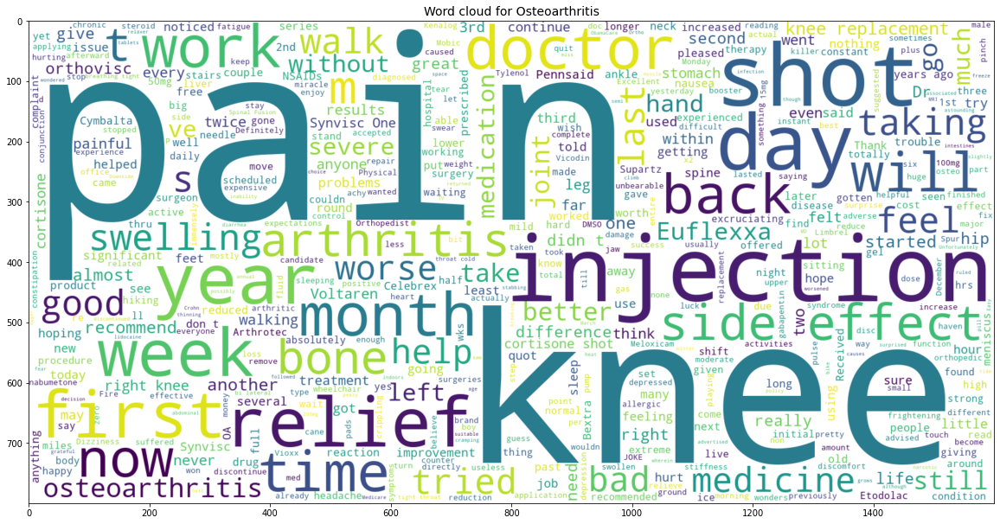

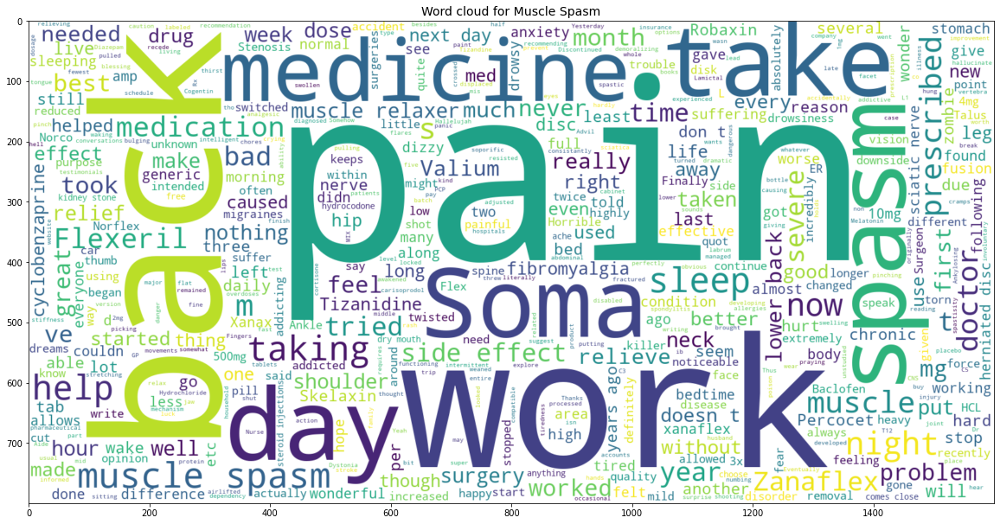

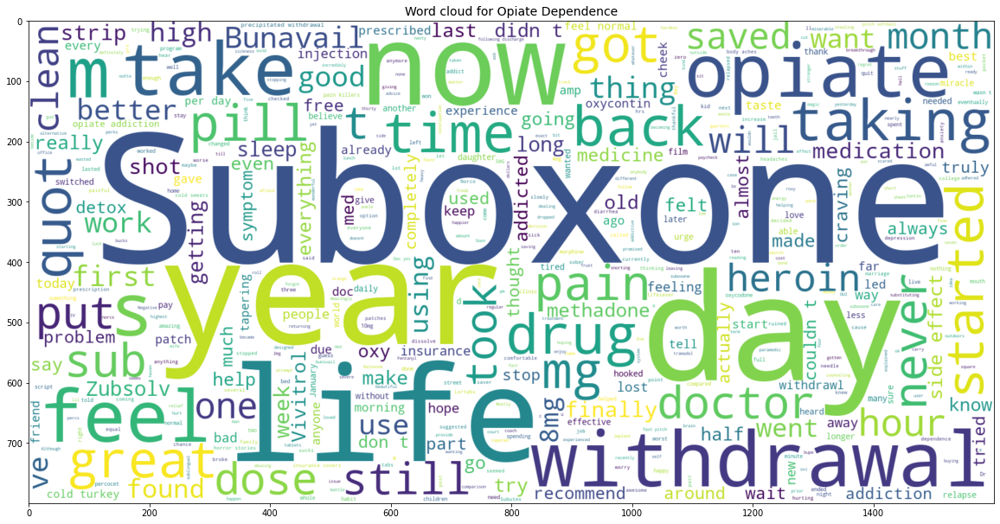

In [30]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
count=0
for cls in pred_conditions:
    plt.figure(figsize = (20,20))
    count+=1
    wc = WordCloud(background_color='white',max_words = 500 , width = 1600 , height = 800).generate(" ".join(df[df['condition']==cls].review))
    plt.imshow(wc , interpolation = 'bilinear')
    plt.title('Word cloud for '+cls,fontsize=14)
    if count == 20:
        break
        
    

**Splitting dataset into train and test(we have used 20-80(test-train) using 50 random sample)**

In [31]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(df['review_cleaned'], df['condition'], stratify=df['condition'], test_size=0.20, random_state=50)

In [32]:
def imp_words(vectorize, classifier, cls, n=5):
    index = list(classifier.classes_).index(cls)
    words = vectorize.get_feature_names_out()
    for c, f in sorted(zip(classifier.coef_[index], words))[-n:]:
        print (cls, f, c)

In [33]:
def imp_words_naive(vectorize, classifier, cls, n=5):
    index = list(classifier.classes_).index(cls)
    words = vectorize.get_feature_names_out()
    for c, f in sorted(zip(classifier.feature_log_prob_[index], words))[-n:]:
        print (cls, f, c)


In [34]:
def print_confusion(cm, s=""):
    cm_df = pd.DataFrame(cm,index = pred_conditions, columns = pred_conditions)
    plt.figure(figsize=(10,8))
    sns.heatmap(cm_df, annot=True, fmt='g')
    plt.title(s+' Confusion Matrix')
    plt.ylabel('Actal Values')
    plt.xlabel('Predicted Values')
    plt.show()

## Bag of Words Tokenizer

In [35]:
bag_vectorizer = CountVectorizer(stop_words='english')
bag_train = bag_vectorizer.fit_transform(Xtrain)
bag_test = bag_vectorizer.transform(Xtest)

In [36]:
bag_train

<6129x10728 sparse matrix of type '<class 'numpy.int64'>'
	with 181973 stored elements in Compressed Sparse Row format>

## Applying Machine Learning Models

### Naive Bayes 

In [37]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [38]:
model = MultinomialNB()
model.fit(bag_train, ytrain)
train_pred=model.predict(bag_train)
pred = model.predict(bag_test)
trainingscore=metrics.accuracy_score(train_pred, ytrain)
print("Training Accuracy :", trainingscore)
score = metrics.accuracy_score(ytest, pred)
print("Testing Accuracy :", score)

Training Accuracy : 0.673682493065753
Testing Accuracy : 0.5316373124592303


In [39]:
cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)

#### Important words for this model 

In [40]:
print("--------------------Bag of words + Naive Bayes------------------------------")
for cls in pred_conditions:
    imp_words_naive(bag_vectorizer, model, cls)
    

--------------------Bag of words + Naive Bayes------------------------------
Birth Control year -4.466940613238458
Birth Control day -4.398454199093303
Birth Control pill -4.1900763363862135
Birth Control month -3.8897585015851366
Birth Control period -3.835130333421821
Depression week -4.805374671096167
Depression effect -4.645188969934439
Depression mg -4.5587794587469075
Depression day -4.519813490213524
Depression depression -4.491554152899121
Pain year -5.1392239358732885
Pain mg -5.098401941353033
Pain work -5.014060792919282
Pain day -4.796816963732261
Pain pain -3.579326468999324
Acne week -4.916867134643747
Acne face -4.794977317034709
Acne month -4.54063166485052
Acne skin -4.3040198964854435
Acne acne -4.07753744390572
Anxiety attack -5.254737164617303
Anxiety taking -5.235688969646609
Anxiety day -4.957485641149372
Anxiety mg -4.63643787485379
Anxiety anxiety -4.146555424933043
Insomnia hour -5.283687054025309
Insomnia taking -5.248595734214039
Insomnia mg -4.87822194591714

Anesthesia woke -7.370680342763528
Anesthesia felt -7.237148950139005
Anesthesia procedure -7.119365914482621
Anesthesia propofol -7.0140053988247955
Anesthesia surgery -7.0140053988247955
Inflammatory Conditions felt -7.370590418749259
Inflammatory Conditions prescribed -7.370590418749259
Inflammatory Conditions week -7.370590418749259
Inflammatory Conditions day -7.013915474810527
Inflammatory Conditions pain -6.426128809908408
Opiate Withdrawal life -7.0123855280602205
Opiate Withdrawal methadone -6.8300639712662665
Opiate Withdrawal year -6.75002126359273
Opiate Withdrawal day -6.675913291439008
Opiate Withdrawal mg -6.48175727699805
Psoriatic Arthritis pain -7.117475809964205
Psoriatic Arthritis week -7.117475809964205
Psoriatic Arthritis arthritis -7.012115294306379
Psoriatic Arthritis feel -7.012115294306379
Psoriatic Arthritis year -6.916805114502054
Menstrual Disorders cycle -7.021262519775731
Menstrual Disorders pill -7.021262519775731
Menstrual Disorders year -7.021262519775

Dermatitis cream -7.6849678346597505
Dermatitis day -7.6849678346597505
Dermatitis dermatitis -7.6849678346597505
Dermatitis eczema -7.6849678346597505
Dermatitis week -7.6849678346597505
Allergic Reactions use -8.195609567288775
Allergic Reactions body -7.9079274948369935
Allergic Reactions dose -7.9079274948369935
Allergic Reactions generally -7.9079274948369935
Allergic Reactions reaction -7.9079274948369935
Kidney Infections uti -7.685978631897201
Kidney Infections effect -7.503657075103247
Kidney Infections levaquin -7.503657075103247
Kidney Infections infection -7.349506395275988
Kidney Infections kidney -7.349506395275988
Rhinitis pain -7.687813831531378
Rhinitis sense -7.687813831531378
Rhinitis smell -7.687813831531378
Rhinitis sinus -7.505492274737424
Rhinitis flonase -7.351341594910165
Human Papilloma Virus cream -7.687997166393015
Human Papilloma Virus day -7.687997166393015
Human Papilloma Virus like -7.687997166393015
Human Papilloma Virus week -7.505675609599061
Human Pa

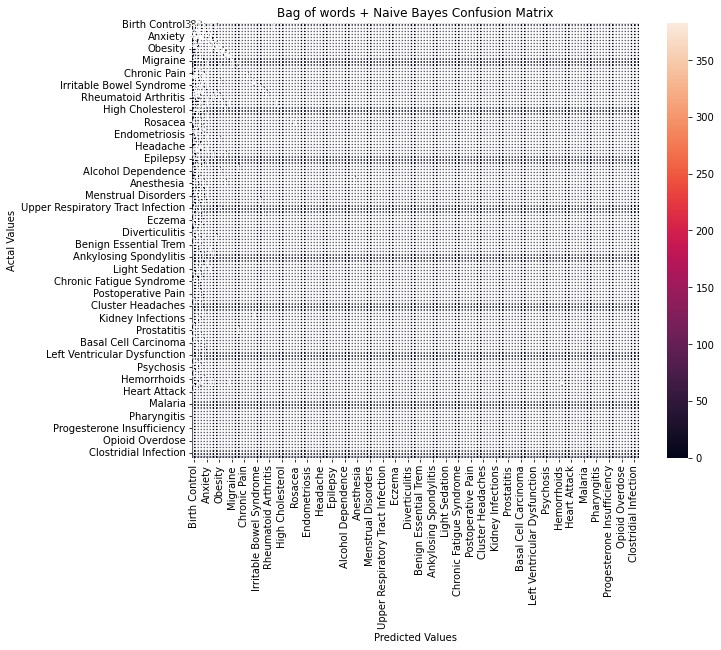

In [41]:
print_confusion(cm, "Bag of words + Naive Bayes")

### Passive Aggressive Classifier

In [42]:
from sklearn.linear_model import PassiveAggressiveClassifier,LogisticRegression
model = PassiveAggressiveClassifier()
model.fit(bag_train, ytrain)
train_pred=model.predict(bag_train)
pred = model.predict(bag_test)
trainingscore=metrics.accuracy_score(train_pred, ytrain)
print("Training Accuracy :", trainingscore)
score = metrics.accuracy_score(ytest, pred)
print("Testing Accuracy :", score)

Training Accuracy : 0.9949420786425192
Testing Accuracy : 0.6164383561643836


In [43]:
cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)

#### Important words for this model 

In [44]:
print("--------------------Bag of words + Passive Agressive------------------------------")
for cls in pred_conditions:
    imp_words(bag_vectorizer, model, cls)
    

--------------------Bag of words + Passive Agressive------------------------------
Birth Control nexplanon 1.5092065195595852
Birth Control moody 1.5116600107845755
Birth Control best 1.7336760926440375
Birth Control awesome 1.7988858055010046
Birth Control nuvaring 1.8416120359304156
Depression medicated 2.0613432276427064
Depression ssri 2.2113117773829183
Depression yawning 2.249819763200788
Depression wellbutrin 2.326342593726788
Depression teen 2.4912254640525155
Pain wonderful 1.6441910706510392
Pain powerful 1.6613288180181875
Pain opana 2.027353936361414
Pain norco 2.214157578484388
Pain nucynta 2.377050122999813
Acne cleared 0.9049161623528154
Acne epiduo 0.9492484220305516
Acne lip 0.9814377853079944
Acne dont 1.207426111505466
Acne solodyn 1.5264171009876202
Anxiety hate 1.9703522837351009
Anxiety sedating 2.0132050876462046
Anxiety peaceful 2.1521951678153335
Anxiety anxiety 2.168050683695662
Anxiety benzodiazepine 2.3284522555693075
Insomnia wake 1.428540558138217
Insomnia

Seizures focal 0.6814869782427603
Seizures evening 0.6908296245128878
Seizures seizure 0.7101707029564346
Seizures vimpat 0.7230030312003732
Seizures keppra 1.3874357595426978
Influenza experience 0.5154302454854723
Influenza flu 0.786505270449259
Influenza foot 0.8980313411444271
Influenza price 1.0983619943132825
Influenza tamiflu 1.5384779638621806
Atrial Fibrillation rythmol 0.5805493652658823
Atrial Fibrillation metropolol 0.6336904310219326
Atrial Fibrillation afib 0.6581881624421725
Atrial Fibrillation atrial 0.8797979982913555
Atrial Fibrillation fibrillation 0.8797979982913555
Epilepsy free 0.6885244997323574
Epilepsy normal 0.7397115354209103
Epilepsy epilepsy 0.7456966403126447
Epilepsy controlled 0.956830570340171
Epilepsy seizure 1.1623183781560444
Asthma medication 0.7474268413638985
Asthma inhaler 0.7968229294992697
Asthma breathe 0.7978064301891251
Asthma panic 0.8764874128400273
Asthma asthma 1.475448664890164
Skin or Soft Tissue Infection cyst 0.5166964868634711
Skin 

Edema manageable 0.3943915392164269
Edema deal 0.4694508851642495
Edema diuretic 0.6347175243872947
Edema edema 0.7999619848333668
Edema lasix 0.9410850195780613
Chronic Fatigue Syndrome amantadine 0.40694161817473823
Chronic Fatigue Syndrome viral 0.6104124272621075
Chronic Fatigue Syndrome nuvigil 0.6183327294410227
Chronic Fatigue Syndrome provigil 0.6282518235469545
Chronic Fatigue Syndrome ill 0.7155326613712918
Alcohol Withdrawal advise 0.3038160448300651
Alcohol Withdrawal alcoholic 0.3038160448300651
Alcohol Withdrawal hr 0.5076359936210794
Alcohol Withdrawal alcohol 0.6671061806601938
Alcohol Withdrawal drinking 0.7335180472500659
Dry Eye Disease xiidra 0.28504376725948927
Dry Eye Disease container 0.30463703980414586
Dry Eye Disease minute 0.32344854650590416
Dry Eye Disease drop 0.3699528835545971
Dry Eye Disease eye 0.5362771331505735
Autism son 0.4396550886979299
Autism hyperactivity 0.45558142230684384
Autism cause 0.4562846615954539
Autism develop 0.47480019391770767
Aut

Undifferentiated Connective Tissue Disease uctd 0.21369950955800626
Undifferentiated Connective Tissue Disease going 0.22692676054737676
Undifferentiated Connective Tissue Disease feeling 0.25409576247735466
Undifferentiated Connective Tissue Disease began 0.2874231601696262
Undifferentiated Connective Tissue Disease weakness 0.2875095405622387
Bursitis able 0.3776042889306673
Bursitis arm 0.43712773765999446
Bursitis worth 0.48833775112034256
Bursitis temporarily 0.5963738422421875
Bursitis relieve 0.7648286616096187
Pharyngitis friday 0.2520686301395465
Pharyngitis monday 0.2520686301395465
Pharyngitis prednisone 0.2520686301395465
Pharyngitis tonsil 0.2520686301395465
Pharyngitis throat 0.34567843652283003
Diaper Rash variety 0.18071138074615
Diaper Rash worked 0.3196911139962864
Diaper Rash butt 0.3614227614923
Diaper Rash paste 0.3614227614923
Diaper Rash time 0.6817094220327788
Trichotillomania psychiatrist 0.16348535355148158
Trichotillomania paxil 0.25158398598554194
Trichotill

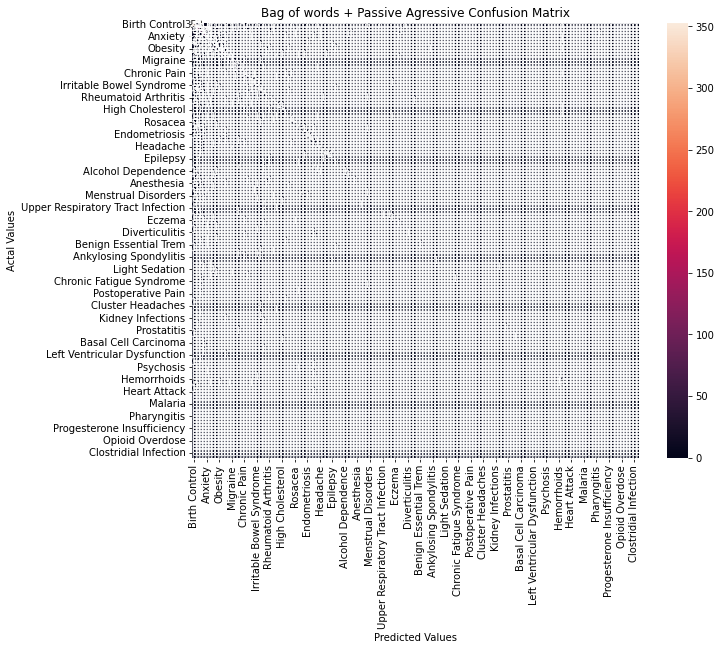

In [45]:
print_confusion(cm, "Bag of words + Passive Agressive")

## TFIDF vectorizer

In [46]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8)
tfidf_train = vectorizer.fit_transform(Xtrain)
tfidf_test = vectorizer.transform(Xtest)

### Naive Bayes

In [47]:
model = MultinomialNB()
model.fit(tfidf_train, ytrain)
pred = model.predict(tfidf_test)
train_pred=model.predict(tfidf_train)
score = metrics.accuracy_score(ytest, pred)
trainingscore=metrics.accuracy_score(train_pred, ytrain)
print("Training Accuracy :", trainingscore)
score = metrics.accuracy_score(ytest, pred)
print("Testing Accuracy :", score)


Training Accuracy : 0.3367596671561429
Testing Accuracy : 0.30006523157208087


In [48]:
cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)

#### Important words for this model 

In [49]:
print("--------------------TFIDF + Naive Bayes------------------------------")
for cls in pred_conditions:
    imp_words_naive(vectorizer, model, cls)
    

--------------------TFIDF + Naive Bayes------------------------------
Birth Control control -5.504751961783898
Birth Control birth -5.464662548268604
Birth Control pill -5.338997250047401
Birth Control month -5.231123067894983
Birth Control period -4.969078371205095
Depression feel -6.4980138295936465
Depression effect -6.424469112986223
Depression anxiety -6.393012956850889
Depression mg -6.209735136942951
Depression depression -5.844847496299346
Pain relief -6.932800253943347
Pain mg -6.926706036750618
Pain medicine -6.845636364471321
Pain work -6.749984768202625
Pain pain -5.423339566832798
Acne clear -6.818498875254801
Acne month -6.588836259143364
Acne face -6.302843691201755
Acne skin -5.9309377012172515
Acne acne -5.747195405742858
Anxiety xanax -6.902122353087211
Anxiety attack -6.593875170401098
Anxiety panic -6.585503004623066
Anxiety mg -6.4804226054533896
Anxiety anxiety -5.794998032574051
Insomnia mg -6.909256115738701
Insomnia asleep -6.776361503766686
Insomnia ambien -6.

Postmenopausal Symptoms great -8.672999331654655
Postmenopausal Symptoms femring -8.654025834464639
Postmenopausal Symptoms sweat -8.578946124804045
Postmenopausal Symptoms hot -8.448731323164273
Postmenopausal Symptoms flash -8.443312292734738
Underactive Thyroid improved -8.611008285356412
Underactive Thyroid medicine -8.56215343534822
Underactive Thyroid feel -8.484005394479118
Underactive Thyroid levothyroxine -8.422555965012974
Underactive Thyroid thyroid -8.331555086816097
Osteoporosis leg -8.42911479770583
Osteoporosis density -8.41106809575186
Osteoporosis prolia -8.348004905203963
Osteoporosis pain -8.342208228182601
Osteoporosis bone -8.045605955450005
Anesthesia sedation -8.593308287832299
Anesthesia surgery -8.484225134695368
Anesthesia colonoscopy -8.419676786436026
Anesthesia procedure -8.333783216340505
Anesthesia propofol -8.186181737041462
Inflammatory Conditions apparent -8.676029217052625
Inflammatory Conditions prescribed -8.635556108337436
Inflammatory Conditions m

Autism son -8.83678001122174
Autism hyperactivity -8.828389244222222
Autism autistic -8.782305103211014
Autism behavior -8.643070981585879
Postoperative Pain bit -8.822444178925661
Postoperative Pain morphine -8.767412461812087
Postoperative Pain surgery -8.74113317537811
Postoperative Pain pain -8.590360291372225
Postoperative Pain toradol -8.497346628578098
Dental Abscess agony -8.868266272760538
Dental Abscess metronidazole -8.814168571349951
Dental Abscess dentist -8.759048396029753
Dental Abscess tooth -8.67537819352929
Dental Abscess gum -8.61146937226758
Peripheral Neuropathy year -8.891578415599307
Peripheral Neuropathy neurontin -8.87998732269466
Peripheral Neuropathy sure -8.871420691240417
Peripheral Neuropathy gabapentin -8.86956769115858
Peripheral Neuropathy pain -8.555919112540307
Alopecia losing -8.884200167088355
Alopecia assist -8.877113686658952
Alopecia head -8.848594058473518
Alopecia using -8.723602987571693
Alopecia hair -8.28035694914512
Cluster Headaches verapa

Diaper Rash nystatin -9.037805687349882
Diaper Rash butt -8.918786412636113
Diaper Rash paste -8.858373598609244
Diaper Rash time -8.778130944974237
Diaper Rash worked -8.631057806926037
Trichotillomania paxil -9.057041132925912
Trichotillomania pick -9.044217487101761
Trichotillomania pulling -8.925097137195873
Trichotillomania cuticle -8.865990995096244
Trichotillomania hair -8.736148847777084
Gastroenteritis hospital -8.946509256391295
Gastroenteritis vomiting -8.94587752936271
Gastroenteritis intense -8.937693514656026
Gastroenteritis bug -8.871050474069436
Gastroenteritis stomach -8.83055088497697
Progesterone Insufficiency subside -8.996829013340106
Progesterone Insufficiency discontinued -8.992300183248734
Progesterone Insufficiency use -8.967354928028003
Progesterone Insufficiency prevented -8.96280958589429
Progesterone Insufficiency itching -8.813113412331708
Angina blockage -8.95795674207204
Angina oral -8.941735616772041
Angina reduction -8.904259974376156
Angina insulin -8

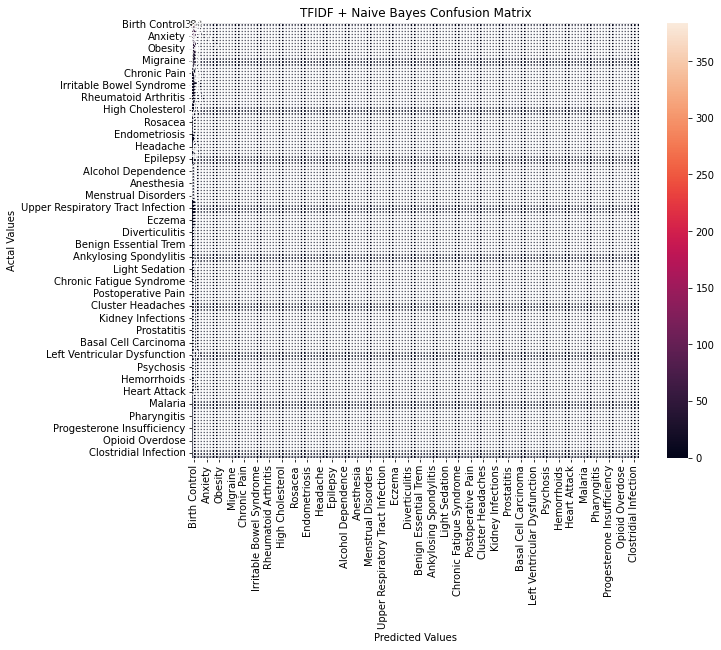

In [50]:
print_confusion(cm, "TFIDF + Naive Bayes")

### Passive Aggressive Classifier

In [51]:
model = PassiveAggressiveClassifier()
model.fit(tfidf_train, ytrain)
pred = model.predict(tfidf_test)
train_pred=model.predict(tfidf_train)
score = metrics.accuracy_score(ytest, pred)
trainingscore=metrics.accuracy_score(train_pred, ytrain)
print("Training Accuracy :", trainingscore)
score = metrics.accuracy_score(ytest, pred)
print("Testing Accuracy :", score)


Training Accuracy : 0.9954315549029206
Testing Accuracy : 0.6986301369863014


In [52]:
cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)

#### Important words for this model 

In [53]:
print("--------------------TFIDF + Passive Agressive------------------------------")
for cls in pred_conditions:
    imp_words(vectorizer, model, cls)
    

--------------------TFIDF + Passive Agressive------------------------------
Birth Control inserted 4.1018532285618665
Birth Control nexplanon 4.214504657521504
Birth Control implanon 4.268041690087376
Birth Control birth 4.532649129190993
Birth Control nuvaring 4.985237583162715
Depression celexa 3.8912109894863955
Depression zoloft 4.269876494570309
Depression yawning 4.661489073223836
Depression wellbutrin 5.292699510096483
Depression depression 6.294154771201783
Pain dilaudid 3.2606957928797393
Pain tp 3.46229388790428
Pain norco 4.44039087910231
Pain opana 4.4956033947336085
Pain nucynta 5.268196611183514
Acne dermatologist 2.707461951980026
Acne skin 2.8615121358394346
Acne epiduo 3.1095900398603717
Acne solodyn 3.141767103523135
Acne acne 3.1978772826271507
Anxiety irritability 2.800454263436138
Anxiety benzodiazepine 3.026600449045722
Anxiety alprazolam 3.283252948481297
Anxiety buspar 4.418091495000627
Anxiety anxiety 6.123323421154239
Insomnia asleep 2.9940621401335212
Insomni

Influenza tamiflu 4.1161918196110765
Atrial Fibrillation metropolol 1.5325887773640374
Atrial Fibrillation rythmol 1.7002653667765548
Atrial Fibrillation atrial 1.907909266136398
Atrial Fibrillation fibrillation 1.907909266136398
Atrial Fibrillation afib 2.372431985355736
Epilepsy trembling 1.4344618499789064
Epilepsy depakote 1.5892416967378256
Epilepsy levetiracetam 1.7413469322772663
Epilepsy seizure 1.8588618560196104
Epilepsy epilepsy 2.145992182111552
Asthma inhaler 1.6090780477880031
Asthma breathe 1.6873170667083235
Asthma breo 1.959168231255983
Asthma singulair 2.282468156478405
Asthma asthma 2.399275407622373
Skin or Soft Tissue Infection exspensive 1.211665160587545
Skin or Soft Tissue Infection infection 1.322089584526694
Skin or Soft Tissue Infection surgical 1.3450991065483737
Skin or Soft Tissue Infection keflex 1.8908678411947601
Skin or Soft Tissue Infection cephalexin 1.938213430903168
Pneumonia surprised 1.2498620273557808
Pneumonia susprised 1.251254871542416
Pneumo

Chronic Fatigue Syndrome amantadine 1.2393579053824895
Chronic Fatigue Syndrome nuvigil 1.4024911798815276
Chronic Fatigue Syndrome viral 1.4307168176562377
Chronic Fatigue Syndrome ill 1.455978110839231
Chronic Fatigue Syndrome provigil 1.6462375180710331
Alcohol Withdrawal advise 0.8752303881828598
Alcohol Withdrawal librium 0.9174951311119798
Alcohol Withdrawal hr 1.0929811006091021
Alcohol Withdrawal drinking 1.4054001514953558
Alcohol Withdrawal alcohol 1.4070218336853146
Dry Eye Disease eye 0.8004786374951391
Dry Eye Disease splitting 0.9308617456635522
Dry Eye Disease container 1.3881619376579237
Dry Eye Disease drop 1.4190215020228631
Dry Eye Disease xiidra 1.4581260686712951
Autism son 0.724968297931429
Autism hyperactivity 1.2627279393382111
Autism autistic 1.2677312494639519
Autism develop 1.312172356315001
Autism behavior 1.4431719308401114
Postoperative Pain spine 1.1988413594096554
Postoperative Pain little 1.2030841116677808
Postoperative Pain morphine 1.3480739475380228

Tinnitus interval 0.7708022490744233
Tinnitus roaring 0.8381835790717774
Tinnitus ringing 0.8494461092059027
Tinnitus zanax 0.9777546276722007
Tinnitus noise 1.3768716438921742
Undifferentiated Connective Tissue Disease sereve 0.7186336226426737
Undifferentiated Connective Tissue Disease weakness 0.882011651455566
Undifferentiated Connective Tissue Disease rheumatologist 0.8869851866353958
Undifferentiated Connective Tissue Disease convulsive 0.9871805995437782
Undifferentiated Connective Tissue Disease uctd 0.9871805995437782
Bursitis prednisone 0.8099200514150149
Bursitis healed 0.8523763617161514
Bursitis bursitis 1.0372540272723694
Bursitis relieve 1.1014850165296852
Bursitis temporarily 1.6819472231064914
Pharyngitis prednisone 0.7168317781586044
Pharyngitis friday 0.7829388690278494
Pharyngitis monday 0.7837177147014734
Pharyngitis throat 0.7886028492732278
Pharyngitis tonsil 1.0446208357194395
Diaper Rash nystatin 0.5512423494004732
Diaper Rash butt 0.873898264883769
Diaper Rash

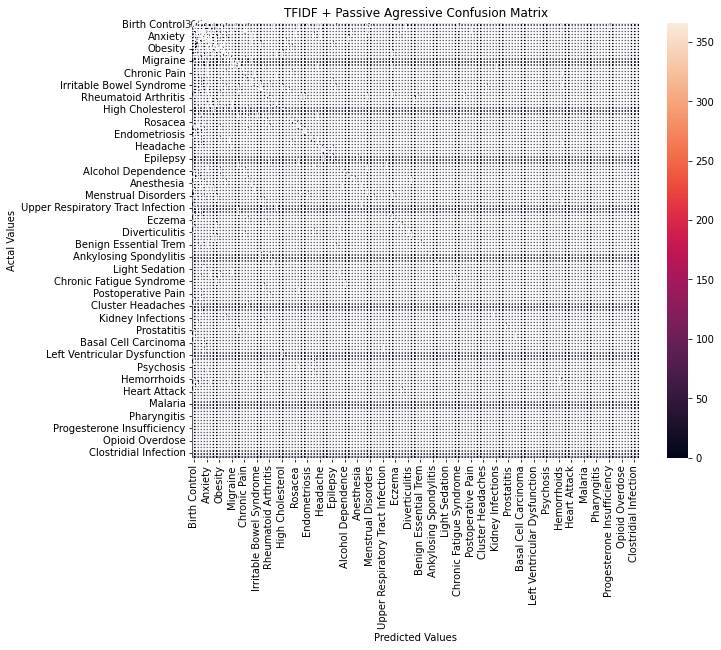

In [54]:
print_confusion(cm, "TFIDF + Passive Agressive")

## TFIDF: Bigrams + Passive Aggressive Classifier

In [55]:
vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,2))
tfidf_train = vectorizer.fit_transform(Xtrain)
tfidf_test = vectorizer.transform(Xtest)

In [71]:
model = PassiveAggressiveClassifier()
model.fit(tfidf_train, ytrain)
pred = model.predict(tfidf_test)
train_pred=model.predict(tfidf_train)
score = metrics.accuracy_score(ytest, pred)
trainingscore=metrics.accuracy_score(train_pred, ytrain)
print("Training Accuracy :", trainingscore)
score = metrics.accuracy_score(ytest, pred)
print("Testing Accuracy :", score)


Training Accuracy : 0.9968999836841247
Testing Accuracy : 0.6797129810828441


In [57]:
cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)

#### Important words for this model 

In [58]:
print("--------------------TFIDF:Bigrams + Passive Agressive------------------------------")
for cls in pred_conditions:
    imp_words(vectorizer, model, cls)
    

--------------------TFIDF:Bigrams + Passive Agressive------------------------------
Birth Control nexplanon 3.2233888837147853
Birth Control birth 3.2816758292209065
Birth Control insertion 3.4148631911361274
Birth Control nuvaring 3.428932334314185
Birth Control period 4.0621903734502105
Depression effexor 3.633501698074984
Depression pristiq 3.7004416247481773
Depression zoloft 3.93235307559425
Depression wellbutrin 4.2040605269769635
Depression depression 6.506564586018724
Pain surgery 2.318704621205308
Pain norco 2.4091555747682185
Pain opana 2.529802052744787
Pain nucynta 3.3754668889831843
Pain pain 3.4705408753993185
Acne accutane 2.498502864662337
Acne epiduo 2.5779584295801183
Acne face 2.6880100313788953
Acne skin 4.107735454140636
Acne acne 4.848032982154437
Anxiety ativan 2.1137751939762564
Anxiety panic 2.1351952555976834
Anxiety xanax 2.289887708190791
Anxiety buspar 2.62750200073496
Anxiety anxiety 6.30261485976254
Insomnia wake 2.4405062708537435
Insomnia asleep 2.76775

Headache midrin 1.5684583511013745
Headache fiorinal 1.7155740410406477
Headache taking year 1.8087997269667189
Headache fioricet 1.8518478495971111
Headache year work 2.1093902397107667
Seizures hive evening 0.785059308905606
Seizures medicine hive 0.785059308905606
Seizures vimpat 0.9040035194029794
Seizures keppra 1.6809486313867372
Seizures seizure 2.1336504370240363
Influenza foot day 0.8591907884596728
Influenza awesome foot 0.8995942029886135
Influenza fever 1.1773008334838815
Influenza flu 1.5402952334328388
Influenza tamiflu 3.650442912000499
Atrial Fibrillation atrial 1.274201751568203
Atrial Fibrillation atrial fibrillation 1.274201751568203
Atrial Fibrillation fibrillation 1.274201751568203
Atrial Fibrillation afib 1.3102895937490304
Atrial Fibrillation rythmol 1.3392418393874053
Epilepsy great seizure 1.0492980939056606
Epilepsy seizure controlled 1.0492980939056606
Epilepsy seizure 1.3608674269380758
Epilepsy epilepsy 1.502590613147357
Epilepsy help work 2.204919131203284

Ankylosing Spondylitis ankylosis 0.8055536062593971
Ankylosing Spondylitis ankylosis spondylitis 0.8055536062593971
Ankylosing Spondylitis drug ankylosis 0.8055536062593971
Ankylosing Spondylitis spondylitis patient 0.8055536062593971
Ankylosing Spondylitis enbrel 0.8156977614434718
Hypertriglyceridemia update 0.646159776101418
Hypertriglyceridemia went month 0.8439873666357148
Hypertriglyceridemia mg dl 1.1574743172967177
Hypertriglyceridemia triglyceride 1.2504350713547219
Hypertriglyceridemia vascepa 1.2945420995915489
Postherpetic Neuralgia tried mylan 0.6048100569657121
Postherpetic Neuralgia watson worst 0.6048100569657121
Postherpetic Neuralgia worst tried 0.6048100569657121
Postherpetic Neuralgia medication month 0.6383889522894334
Postherpetic Neuralgia horizant 0.9518801147218227
Dry Skin makeup remover 0.5737265739890942
Dry Skin baby 0.6352963034257616
Dry Skin foot 0.7132186428566412
Dry Skin remover 0.7306117741063242
Dry Skin eczema 0.9225836693346156
Light Sedation non 

Psychosis thinking experience 0.38472939926751776
Psychosis tremor hand 0.38472939926751776
Psychosis unless looking 0.38472939926751776
Psychosis watching unless 0.38472939926751776
Psychosis year anticipate 0.38472939926751776
Supraventricular Tachycardia palpitation cardiologist 0.36377773136490377
Supraventricular Tachycardia started diltiazem 0.36377773136490377
Supraventricular Tachycardia switched bystolic 0.36377773136490377
Supraventricular Tachycardia palpitation 0.49826684235111157
Supraventricular Tachycardia svt 0.6678845925943127
Indigestion lot better 0.8066986935268261
Indigestion medicine stomach 0.8539292172492958
Indigestion feel lot 0.9244190092985795
Indigestion love medicine 0.9478057741502731
Indigestion stomach feel 1.1287436319916588
Oral Thrush yogurt resolved 0.33727361542289563
Oral Thrush throat 0.3862528506041071
Oral Thrush radiation 0.5697291873375826
Oral Thrush lozenge 0.6227560565071002
Oral Thrush lozenge day 0.6745472308457913
Hemorrhoids size smear

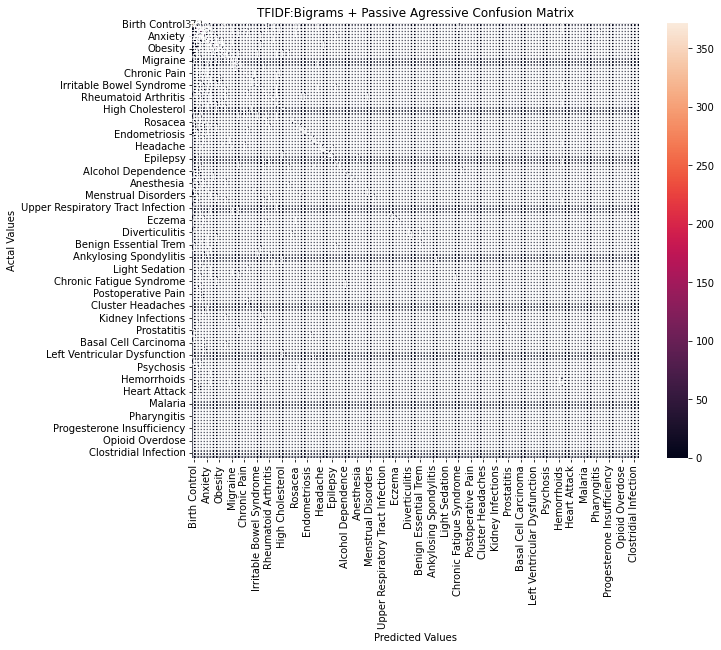

In [59]:
print_confusion(cm, "TFIDF:Bigrams + Passive Agressive")

## TFIDF : Trigrams + Passive Aggressive Classifier

Training Accuracy : 0.9970631424375918
Testing Accuracy : 0.6992824527071102
--------------------TFIDF:Trigrams Grams + Passive Agressive------------------------------
Birth Control bleeding 3.920611155772844
Birth Control nexplanon 3.960704360917074
Birth Control birth 3.9671195054481134
Birth Control insertion 4.011438579525004
Birth Control period 5.44183438876245
Depression pristiq 3.6487666017238523
Depression zoloft 3.918160040316056
Depression effexor 4.02703393786909
Depression wellbutrin 4.116783523645513
Depression depression 7.504148773579937
Pain opana 2.1682438793275294
Pain norco 2.203692724701289
Pain surgery 2.2551060607795694
Pain nucynta 2.9988241342883586
Pain pain 4.228094349988739
Acne dermatologist 2.3976473988169804
Acne epiduo 2.6036093403532474
Acne face 3.2748881752491754
Acne skin 4.987787017765784
Acne acne 5.829859768624719
Anxiety ativan 2.121918204334609
Anxiety buspar 2.4100825741381886
Anxiety panic 2.558360009966692
Anxiety xanax 2.729015270350713
Anxi

Chlamydia Infection effect taste 0.767203292755148
Chlamydia Infection day effect taste 0.8448544725770598
Chlamydia Infection took day effect 0.8448544725770598
Chlamydia Infection worked took day 0.8448544725770598
Chlamydia Infection chlamydia 0.9507157802990867
Headache midrin 1.2922177480664914
Headache taking year work 1.30257796663033
Headache year work problem 1.372554460756571
Headache fioricet 1.3886417923914323
Headache fiorinal 1.5076816087079568
Seizures vimpat 0.7071395720419218
Seizures focal 0.7871985354561694
Seizures focal seizure 0.7871985354561694
Seizures keppra 1.4537716819612811
Seizures seizure 2.142189112733051
Influenza took dose 0.6636091135472946
Influenza prescribed tamiflu 0.6953497569788738
Influenza fever 1.0643506892917038
Influenza flu 1.3854992283820096
Influenza tamiflu 3.258094073432097
Atrial Fibrillation afib 1.009329780244106
Atrial Fibrillation rythmol 1.0913467132048051
Atrial Fibrillation atrial 1.1486254628825947
Atrial Fibrillation atrial fi

COPD rescue 0.4749227328226008
COPD medication copd 0.5731807528415527
COPD daliresp 0.6417616249303499
COPD copd 0.6730204458980582
COPD anoro 1.0176383930329094
Allergies like simply 0.6031314430329301
Allergies like simply absolutely 0.6031314430329301
Allergies simply absolutely 0.6031314430329301
Allergies simply absolutely allergy 0.6031314430329301
Allergies allergy symptom 0.8282971903383021
Diarrhea control diarrhea 0.4488294190234357
Diarrhea bathroom 0.4589240281484371
Diarrhea diarrhea 0.506414277327769
Diarrhea taking lomotil 0.5401670273746767
Diarrhea lomotil 1.7207648569648823
Ankylosing Spondylitis drug ankylosis 0.6547197544479656
Ankylosing Spondylitis drug ankylosis spondylitis 0.6547197544479656
Ankylosing Spondylitis spondylitis patient 0.6547197544479656
Ankylosing Spondylitis wonderful drug ankylosis 0.6547197544479656
Ankylosing Spondylitis enbrel 0.6780300653881696
Hypertriglyceridemia cholesterol 0.5136001787230015
Hypertriglyceridemia went month 0.5730531806

Left Ventricular Dysfunction used coreg feeling 0.4049702824765037
Left Ventricular Dysfunction ventricular dysfunction 0.4049702824765037
Left Ventricular Dysfunction ventricular dysfunction improved 0.4049702824765037
Left Ventricular Dysfunction heart pounding 0.41529169463537685
Left Ventricular Dysfunction good control 0.4439499278686523
Giardiasis think guardia extra 0.2686462321873372
Giardiasis time day treat 0.2686462321873372
Giardiasis treat giardia 0.2686462321873372
Giardiasis treat giardia diarrhea 0.2686462321873372
Giardiasis giardia 0.8741882044703786
Uterine Fibroids horror 0.22836518069428893
Uterine Fibroids horror story 0.23310575955922247
Uterine Fibroids received 0.2703738921539982
Uterine Fibroids fibroid 0.30485942089630685
Uterine Fibroids lupron 0.45765116813661466
Uveitis opthalmic 0.6722175087962051
Uveitis opthalmic steroid 0.6722175087962051
Uveitis opthalmic steroid used 0.6722175087962051
Uveitis steroid used condition 0.6722175087962051
Uveitis used co

Dermatomyositis year half starting 0.27228197460322584
Dermatomyositis inch 0.3292905606909891
Dermatomyositis scalp 0.37953383256271306
Dermatomyositis lesion 0.4324128695851367
Dermatomyositis plaquenil 0.5746319118695827


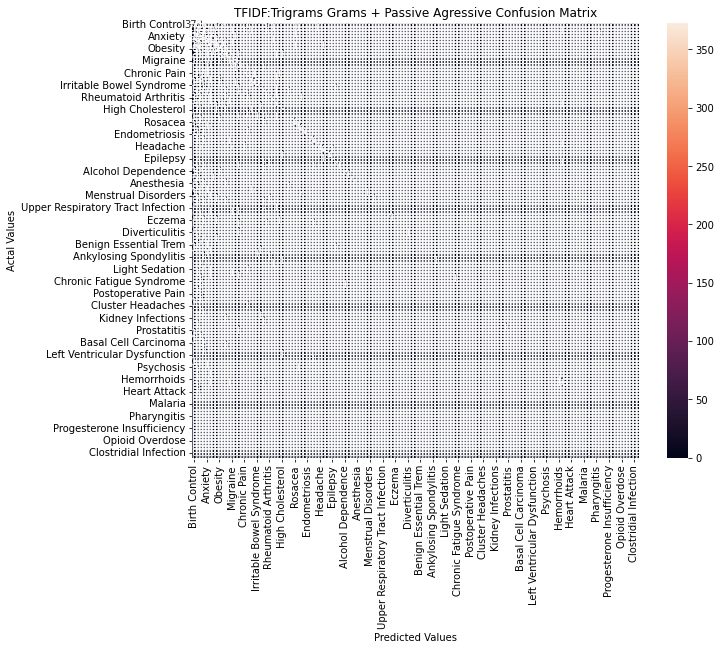

In [61]:
vectorizer_final = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,3))
tfidf_train = vectorizer_final.fit_transform(Xtrain)
tfidf_test = vectorizer_final.transform(Xtest)

model = PassiveAggressiveClassifier()
model.fit(tfidf_train, ytrain)
pred = model.predict(tfidf_test)
train_pred=model.predict(tfidf_train)
score = metrics.accuracy_score(ytest, pred)
trainingscore=metrics.accuracy_score(train_pred, ytrain)
print("Training Accuracy :", trainingscore)
score = metrics.accuracy_score(ytest, pred)
print("Testing Accuracy :", score)


print("--------------------TFIDF:Trigrams Grams + Passive Agressive------------------------------")
for cls in pred_conditions:
    imp_words(vectorizer_final, model, cls)

cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)
print_confusion(cm, "TFIDF:Trigrams Grams + Passive Agressive")


In [62]:
cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)

#### Important words for this model 

In [63]:
print("--------------------TFIDF:Trigrams + Passive Agressive------------------------------")
for cls in pred_conditions:
    imp_words(vectorizer, model, cls)
    

--------------------TFIDF:Trigrams + Passive Agressive------------------------------
Birth Control wrong pill 3.0984343109575136
Birth Control daily eating 3.7544730466807663
Birth Control day using 3.920611155772844
Birth Control daily dependent 3.9671195054481134
Birth Control yasmin skin 4.011438579525004
Depression hospital clarythormycin 2.340979105634531
Depression belly unsettling 3.0777085503438375
Depression ended rebound 3.0793511008887458
Depression oily willing 4.02703393786909
Depression lb taking 7.504148773579937
Pain control remember 1.5883070151243117
Pain long year 1.7883858088157212
Pain panicking right 1.788622593289849
Pain neutrogena 1.8319601177847484
Pain lose lot 1.9607197178173033
Acne activity state 2.163630172391284
Acne level interfered 2.3976473988169804
Acne painful injury 2.6036093403532474
Acne predictable month 3.2748881752491754
Acne addiction great 5.829859768624719
Anxiety dull headache 1.8041905642336231
Anxiety tooth gum 1.8247520638740917
Anxiety

Benign Prostatic Hyperplasia effect extreme 0.8137795132671332
Benign Prostatic Hyperplasia old noticed 0.9446027685210032
Benign Prostatic Hyperplasia ritalin general 1.4282807717578763
Benign Prostatic Hyperplasia fact life 1.5623256621733554
Benign Prostatic Hyperplasia ringing 1.624268282918407
Bacterial Vaginitis product job 0.7534160621783926
Bacterial Vaginitis product kind 0.8956736615082976
Bacterial Vaginitis summer nauseated 0.8956736615082976
Bacterial Vaginitis summer prescribed 0.8956736615082976
Bacterial Vaginitis drug greatly 2.472419098366529
Chlamydia Infection apparently tilted 0.7199793318057328
Chlamydia Infection hysterectomy month 0.7199793318057328
Chlamydia Infection number begun 0.767203292755148
Chlamydia Infection improved lesion 0.8448544725770598
Chlamydia Infection extra water 0.9507157802990867
Headache year massive 0.7481227307796686
Headache thinking eventually 0.8019479829080732
Headache ocella year 0.9127415228855379
Headache returned vengeance 1.38

Sciatica scheduled op 0.5341523287667157
Sciatica sleep goitre 0.5341523287667157
Sciatica sleep gone 0.5341523287667157
Sciatica breathing manage 0.5375802555034856
Sciatica away intend 0.5641274887529386
Benign Essential Trem non prescription 0.39387177496440295
Benign Essential Trem non sedadting 0.39387177496440295
Benign Essential Trem ware make 0.39387177496440295
Benign Essential Trem ware stop 0.39387177496440295
Benign Essential Trem work push 0.8291042968112616
COPD growth problem 0.34848700911581265
COPD rid severe 0.41515435391513017
COPD hungry pill 0.6417616249303499
COPD grown feel 0.6730204458980582
COPD began kick 1.0176383930329094
Allergies ache using 0.6031314430329301
Allergies ache vivid 0.6031314430329301
Allergies normal hopefully 0.6031314430329301
Allergies placed mg 0.6031314430329301
Allergies awful glad 0.8282971903383021
Diarrhea treated symptom 0.425943298689462
Diarrhea treated time 0.425943298689462
Diarrhea goodness understanding 0.4488294190234357
Dia

Strep Throat mrsa skin 0.2930716729871841
Strep Throat worked migrane 0.2930716729871841
Strep Throat effective dose 0.38850592014395835
Strep Throat obese 1.0454456443170654
Strep Throat obese overweight 1.0454456443170654
Reflex Sympathetic Dystrophy Syndrome normal counseling 0.42133298334954516
Reflex Sympathetic Dystrophy Syndrome oral worked 0.42133298334954516
Reflex Sympathetic Dystrophy Syndrome pill tear 0.42133298334954516
Reflex Sympathetic Dystrophy Syndrome shorter length 0.42133298334954516
Reflex Sympathetic Dystrophy Syndrome shorter lighter 0.42133298334954516
Left Ventricular Dysfunction movement soft 0.4049702824765037
Left Ventricular Dysfunction nut hormone 0.4049702824765037
Left Ventricular Dysfunction realized suicidal 0.4049702824765037
Left Ventricular Dysfunction time learn 0.41529169463537685
Left Ventricular Dysfunction starting cramp 0.4439499278686523
Giardiasis softball archery 0.2686462321873372
Giardiasis sweaty mark 0.2686462321873372
Giardiasis swea

Dermatomyositis meant working 0.27228197460322584
Dermatomyositis taken medicine 0.27228197460322584
Dermatomyositis taking fast 0.27228197460322584
Dermatomyositis taking fastin 0.27228197460322584
Dermatomyositis withdrawal longer 0.3292905606909891


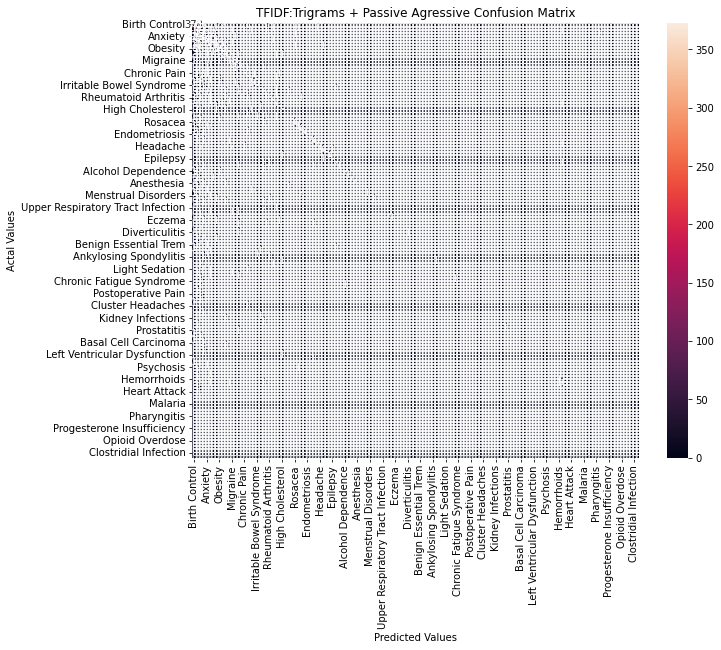

In [64]:
print_confusion(cm, "TFIDF:Trigrams + Passive Agressive")

Training Accuracy : 0.9970631424375918
Testing Accuracy : 0.6921069797782127
--------------------TFIDF:Four Grams + Passive Agressive------------------------------
Birth Control bleeding 4.245080536786184
Birth Control insertion 4.293506943357834
Birth Control birth control 4.438905826578767
Birth Control birth 4.704978118951093
Birth Control period 6.558742809314876
Depression pristiq 3.5984136073877995
Depression effexor 3.764409244397667
Depression zoloft 3.805209632540087
Depression wellbutrin 3.8513925087130865
Depression depression 7.538457988766523
Pain opana 1.9448490203761468
Pain patch 2.018723484837594
Pain surgery 2.246570029832428
Pain nucynta 2.6301491594602515
Pain pain 4.641172989647944
Acne dermatologist 2.2716124446760473
Acne epiduo 2.7158697489854684
Acne face 3.4455788403985657
Acne skin 5.137453972323868
Acne acne 6.359883523310147
Anxiety ativan 2.067734940954198
Anxiety attack 2.1818423820471824
Anxiety xanax 2.6953569931180414
Anxiety panic 2.7618027183086657
A

Chlamydia Infection took day effect 0.7297555313097158
Chlamydia Infection took day effect taste 0.7297555313097158
Chlamydia Infection worked took day 0.7297555313097158
Chlamydia Infection worked took day effect 0.7297555313097158
Chlamydia Infection chlamydia 0.8112301606079355
Headache taking year work problem 1.1388195678612825
Headache year work problem 1.1388195678612825
Headache migraine 1.1973832782571412
Headache fioricet 1.2090894354782524
Headache fiorinal 1.394309863779459
Seizures great 0.837024536565569
Seizures focal 0.8407477617008067
Seizures focal seizure 0.8407477617008067
Seizures keppra 1.3038576658506342
Seizures seizure 2.159041266966758
Influenza took dose 0.559706092847895
Influenza prescribed tamiflu 0.6816621816262999
Influenza fever 1.0320013101800196
Influenza flu 1.3540499649861963
Influenza tamiflu 3.038119540003284
Atrial Fibrillation afib 0.8401990276567392
Atrial Fibrillation rythmol 0.94801965739981
Atrial Fibrillation atrial 1.0354555336732971
Atria

COPD rescue 0.4257934417561446
COPD medication copd 0.48627694006243183
COPD daliresp 0.5357458914303183
COPD copd 0.5576917522328937
COPD anoro 0.8521139382230982
Allergies like simply absolutely allergy 0.5182515794894853
Allergies simply absolutely 0.5182515794894853
Allergies simply absolutely allergy 0.5182515794894853
Allergies simply absolutely allergy symptom 0.5182515794894853
Allergies allergy symptom 0.703038540242687
Diarrhea control diarrhea 0.39615515354769637
Diarrhea bathroom 0.42005942067686547
Diarrhea taking lomotil 0.4571457016591022
Diarrhea diarrhea 0.5911863852165835
Diarrhea lomotil 1.4868963590604225
Ankylosing Spondylitis drug ankylosis spondylitis patient 0.5976473025584713
Ankylosing Spondylitis spondylitis patient 0.5976473025584713
Ankylosing Spondylitis wonderful drug ankylosis 0.5976473025584713
Ankylosing Spondylitis wonderful drug ankylosis spondylitis 0.5976473025584713
Ankylosing Spondylitis spondylitis 0.6034343599628449
Hypertriglyceridemia dl 0.45

Left Ventricular Dysfunction used coreg feeling better 0.33479529669559294
Left Ventricular Dysfunction ventricular dysfunction 0.33479529669559294
Left Ventricular Dysfunction ventricular dysfunction improved 0.33479529669559294
Left Ventricular Dysfunction heart pounding 0.34771076846725335
Left Ventricular Dysfunction good control 0.3625225738209811
Giardiasis time day treat giardia 0.22326863254901116
Giardiasis treat giardia 0.22326863254901116
Giardiasis treat giardia diarrhea 0.22326863254901116
Giardiasis treat giardia diarrhea diardia 0.22326863254901116
Giardiasis giardia 0.7328085134278594
Uterine Fibroids willing bleeding control build 0.17352631283375997
Uterine Fibroids horror 0.20640798485911746
Uterine Fibroids horror story 0.21069275948019492
Uterine Fibroids fibroid 0.27791157441619363
Uterine Fibroids lupron 0.3810336031833444
Uveitis opthalmic steroid 0.5979066024746522
Uveitis opthalmic steroid used 0.5979066024746522
Uveitis opthalmic steroid used condition 0.5979

Clostridial Infection week flagyl 0.22447431703122894
Clostridial Infection week flagyl total 0.22447431703122894
Clostridial Infection week flagyl total disability 0.22447431703122894
Clostridial Infection die 0.3062353940018627
Clostridial Infection diff 0.5070419399916684
Dermatomyositis year half starting react 0.23348849588024695
Dermatomyositis inch 0.24223374297604738
Dermatomyositis scalp 0.35672024765174887
Dermatomyositis lesion 0.36610155526898047
Dermatomyositis plaquenil 0.4969731646381993


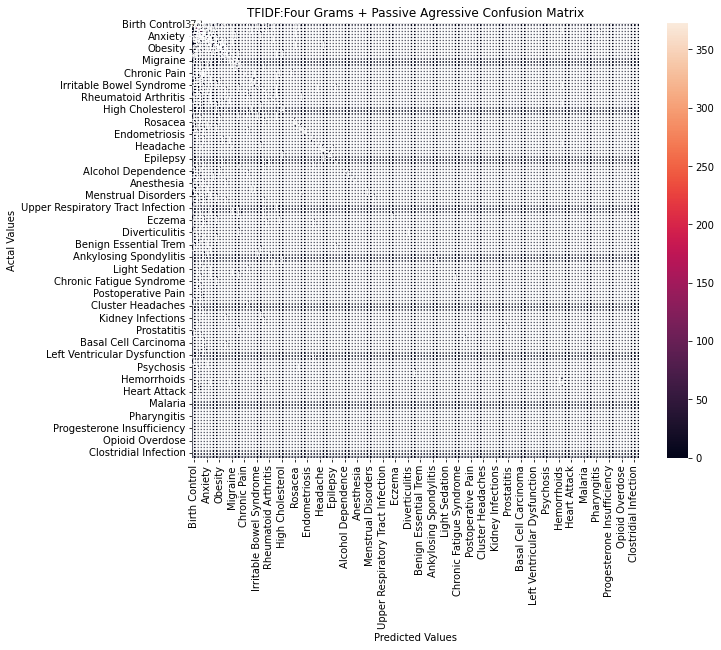

In [65]:
vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,4))
tfidf_train = vectorizer.fit_transform(Xtrain)
tfidf_test = vectorizer.transform(Xtest)

model = PassiveAggressiveClassifier()
model.fit(tfidf_train, ytrain)
pred = model.predict(tfidf_test)
train_pred=model.predict(tfidf_train)
score = metrics.accuracy_score(ytest, pred)
trainingscore=metrics.accuracy_score(train_pred, ytrain)
print("Training Accuracy :", trainingscore)
score = metrics.accuracy_score(ytest, pred)
print("Testing Accuracy :", score)

cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)

print("--------------------TFIDF:Four Grams + Passive Agressive------------------------------")
for cls in pred_conditions:
    imp_words(vectorizer, model, cls)
    

print_confusion(cm, "TFIDF:Four Grams + Passive Agressive")

accuracy:   0.682
--------------------TFIDF:Five Grams + Passive Agressive------------------------------
Birth Control insertion 4.5203897750236095
Birth Control bleeding 4.523547708645807
Birth Control birth control 5.000595743834861
Birth Control birth 5.309347720145625
Birth Control period 7.403258397262428
Depression pristiq 3.418485256498454
Depression zoloft 3.650733343847229
Depression effexor 3.6849487657174036
Depression wellbutrin 3.7012240754313397
Depression depression 7.593034059510752
Pain powerful 1.851482740915357
Pain patch 2.0067758887622147
Pain surgery 2.2427295477703972
Pain nucynta 2.4307495130918144
Pain pain 5.150083208200659
Acne pimple 2.3754997118207832
Acne epiduo 2.5784812748547834
Acne face 3.729299242981288
Acne skin 5.35000966306924
Acne acne 6.616099090569818
Anxiety attack 2.0656440190860414
Anxiety ativan 2.070724615240179
Anxiety xanax 2.7110381653439783
Anxiety panic 2.7237668039768512
Anxiety anxiety 6.906714441165744
Insomnia wake 2.45140761163772

Chlamydia Infection took day effect taste 0.6772375784145575
Chlamydia Infection worked took day 0.6772375784145575
Chlamydia Infection worked took day effect 0.6772375784145575
Chlamydia Infection worked took day effect taste 0.6772375784145575
Chlamydia Infection chlamydia 0.7262903675303723
Headache taking year work 1.085981474452422
Headache migraine 1.1295749792669965
Headache taking year work problem 1.1408854198862328
Headache year work problem 1.1408854198862328
Headache fiorinal 1.3283826542251833
Seizures dilantin 0.5345680850377373
Seizures focal 0.8348137450824806
Seizures focal seizure 0.8348137450824806
Seizures keppra 1.188403228555595
Seizures seizure 2.057643963618765
Influenza took dose 0.5657953306406885
Influenza prescribed tamiflu 0.6369715067779551
Influenza fever 0.9707265058510658
Influenza flu 1.278238145109284
Influenza tamiflu 2.879951502512474
Atrial Fibrillation afib 0.7501473632398457
Atrial Fibrillation rythmol 0.8546651118379816
Atrial Fibrillation atria

Benign Essential Trem week noticed marked 0.4255265198836856
Benign Essential Trem week noticed marked improvement 0.4255265198836856
Benign Essential Trem primidone 0.5675668495993703
Benign Essential Trem inderal 0.646669161378509
Benign Essential Trem tremor 1.4419708192323886
COPD rescue 0.37311990188893124
COPD medication copd 0.4372282828462446
COPD daliresp 0.4789440928209732
COPD copd 0.5173065270258603
COPD anoro 0.7577885108506756
Allergies like simply absolutely allergy symptom 0.4729956384621157
Allergies simply absolutely 0.4729956384621157
Allergies simply absolutely allergy 0.4729956384621157
Allergies simply absolutely allergy symptom 0.4729956384621157
Allergies allergy symptom 0.638502324729574
Diarrhea control diarrhea 0.35420872615597204
Diarrhea bathroom 0.36725587753818456
Diarrhea taking lomotil 0.40920764658717207
Diarrhea diarrhea 0.5321928374784879
Diarrhea lomotil 1.3234554109780194
Ankylosing Spondylitis spondylitis patient 0.5652202538612181
Ankylosing Spon

Erosive Esophagitis year evidence esophageal erosion diagnosed 0.21480592336308146
Erosive Esophagitis nexium 0.2797326129867535
Erosive Esophagitis aciphex 0.328910803762651
Erosive Esophagitis choked 0.34508683678353735
Erosive Esophagitis choked food 0.34508683678353735
Strep Throat strep 0.342945423578618
Strep Throat wiped 0.8891155834790033
Strep Throat effect wiped 1.056368734595366
Strep Throat effect wiped day 1.056368734595366
Strep Throat wiped day 1.056368734595366
Reflex Sympathetic Dystrophy Syndrome weight gain amitriptyline 0.3079934781572271
Reflex Sympathetic Dystrophy Syndrome weight gain amitriptyline miracle 0.3079934781572271
Reflex Sympathetic Dystrophy Syndrome weight gain amitriptyline miracle mean 0.3079934781572271
Reflex Sympathetic Dystrophy Syndrome rsd 0.40671857433001674
Reflex Sympathetic Dystrophy Syndrome lyrica 0.4593164378579833
Left Ventricular Dysfunction used coreg feeling better 0.29701565772112815
Left Ventricular Dysfunction used coreg feeling

Opioid Overdose twice er day rose 0.3464878406597446
Opioid Overdose twice er day rose misery 0.3464878406597446
Opioid Overdose narcan 0.6461768893327426
Opioid Overdose narcan saved 0.6461768893327426
Opioid Overdose narcan saved life 0.6461768893327426
Conjunctivitis point nausea minute 0.3459525696768535
Conjunctivitis point nausea minute dosage 0.3459525696768535
Conjunctivitis point nausea minute dosage symptom 0.3459525696768535
Conjunctivitis symptom dissappear 0.3459525696768535
Conjunctivitis symptom dissappear quickly 0.3459525696768535
Dermatological Disorders wonderfully really impressed product quickly 0.2817352068909908
Dermatological Disorders work wonderfully really 0.2817352068909908
Dermatological Disorders work wonderfully really impressed 0.2817352068909908
Dermatological Disorders work wonderfully really impressed product 0.2817352068909908
Dermatological Disorders product 0.28612147951587547
Night Terrors read understand non medical folk 0.3827659224034867
Night 

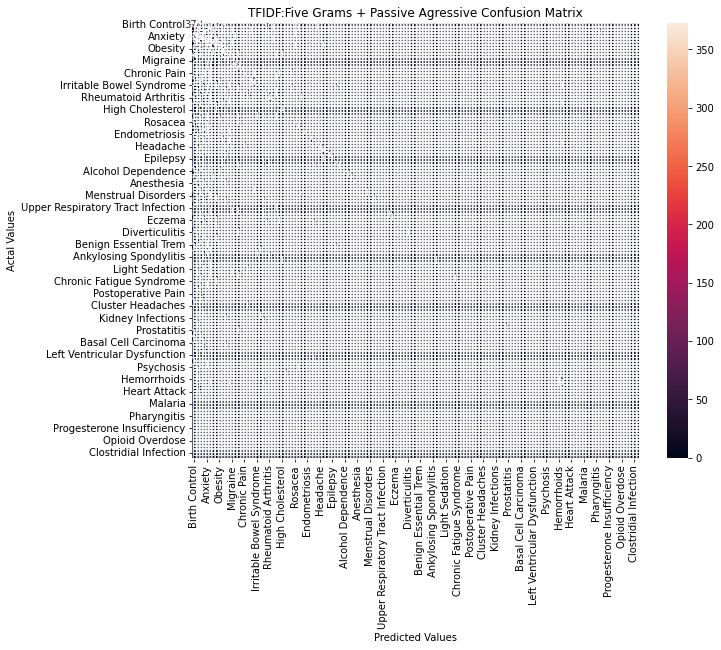

In [66]:
vectorizer_final = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,5))
tfidf_train = vectorizer_final.fit_transform(Xtrain)
tfidf_test = vectorizer_final.transform(Xtest)

model_final = PassiveAggressiveClassifier()
model_final.fit(tfidf_train, ytrain)
pred = model_final.predict(tfidf_test)
score = metrics.accuracy_score(ytest, pred)
print("accuracy:   %0.3f" % score)

print("--------------------TFIDF:Five Grams + Passive Agressive------------------------------")
for cls in pred_conditions:
    imp_words(vectorizer_final, model_final, cls)

cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)
print_confusion(cm, "TFIDF:Five Grams + Passive Agressive")

Training Accuracy : 0.9970631424375918
Testing Accuracy : 0.6777560339204175
--------------------TFIDF:Six Grams + Passive Agressive------------------------------
Birth Control insertion 4.397497623101502
Birth Control bleeding 4.544918890738085
Birth Control birth control 5.292218752915505
Birth Control birth 5.556066971730641
Birth Control period 8.173885019177026
Depression pristiq 3.3005006017970695
Depression wellbutrin 3.543525605309632
Depression effexor 3.5623047174328306
Depression zoloft 3.6276821384182156
Depression depression 7.547783662034175
Pain powerful 1.8563955131525303
Pain patch 2.065312735285545
Pain surgery 2.28386708927404
Pain nucynta 2.310096829139429
Pain pain 5.187889312119271
Acne dermatologist 2.2517375250312255
Acne epiduo 2.4968244544984146
Acne face 3.784306921980669
Acne skin 5.560214753487527
Acne acne 6.704561328698635
Anxiety ativan 2.0442292626419225
Anxiety attack 2.1513123872706674
Anxiety xanax 2.714156563188521
Anxiety panic 2.7345225420904735
A

Chlamydia Infection took day effect 0.6850862224461178
Chlamydia Infection took day effect taste 0.6850862224461178
Chlamydia Infection worked took day 0.6850862224461178
Chlamydia Infection worked took day effect 0.6850862224461178
Chlamydia Infection worked took day effect taste 0.6850862224461178
Headache taking year work 1.0869570604687364
Headache taking year work problem 1.142186413236634
Headache year work problem 1.142186413236634
Headache migraine 1.1837984368863952
Headache fiorinal 1.2548622909733955
Seizures dilantin 0.5097774148323936
Seizures focal 0.9227555580203327
Seizures focal seizure 0.9227555580203327
Seizures keppra 1.101425835141651
Seizures seizure 2.066164699254118
Influenza took dose 0.5280903750733242
Influenza prescribed tamiflu 0.6056587456652337
Influenza fever 0.9390057220181152
Influenza flu 1.2358521504903401
Influenza tamiflu 2.825551269952346
Atrial Fibrillation afib 0.6738072457964631
Atrial Fibrillation rythmol 0.7953199474789451
Atrial Fibrillation

Benign Essential Trem week noticed marked 0.3915863196100572
Benign Essential Trem week noticed marked improvement 0.3915863196100572
Benign Essential Trem primidone 0.5103797924669515
Benign Essential Trem inderal 0.5922115872949532
Benign Essential Trem tremor 1.318563265355008
COPD flare ups 0.3423665190571375
COPD medication copd 0.3985866520765613
COPD daliresp 0.4449818699275068
COPD copd 0.46552794890074095
COPD anoro 0.6941302859935945
Allergies like simply absolutely allergy symptom 0.44778164199064335
Allergies simply absolutely 0.44778164199064335
Allergies simply absolutely allergy 0.44778164199064335
Allergies simply absolutely allergy symptom 0.44778164199064335
Allergies allergy symptom 0.5971223879019658
Diarrhea control diarrhea 0.31542270960720875
Diarrhea bathroom 0.33892217054782375
Diarrhea taking lomotil 0.385022039802408
Diarrhea diarrhea 0.4178421903084413
Diarrhea lomotil 1.2047029750942615
Ankylosing Spondylitis drug ankylosis spondylitis patient 0.57312082615

Basal Cell Carcinoma visible 0.2858288043946089
Basal Cell Carcinoma nail usually 0.2982255228320512
Basal Cell Carcinoma nail usually split 0.2982255228320512
Basal Cell Carcinoma usually split 0.2982255228320512
Basal Cell Carcinoma nail 0.44103461219233364
Erosive Esophagitis concern 0.20704741308220911
Erosive Esophagitis nexium 0.253868291265121
Erosive Esophagitis choked 0.3086385036190715
Erosive Esophagitis choked food 0.3086385036190715
Erosive Esophagitis aciphex 0.31062573730354853
Strep Throat strep 0.2859177700350304
Strep Throat wiped 0.8744619800240081
Strep Throat effect wiped 1.0563329984283993
Strep Throat effect wiped day 1.0563329984283993
Strep Throat wiped day 1.0563329984283993
Reflex Sympathetic Dystrophy Syndrome weight gain amitriptyline miracle 0.27599114682679854
Reflex Sympathetic Dystrophy Syndrome weight gain amitriptyline miracle mean 0.27599114682679854
Reflex Sympathetic Dystrophy Syndrome weight gain amitriptyline miracle mean experience 0.27599114682

Anorexia weight think 0.18001620125874748
Anorexia weight think figured 0.18001620125874748
Anorexia weight think figured curvy 0.18001620125874748
Anorexia weight think figured curvy look 0.18001620125874748
Anorexia weight think figured curvy look want 0.18001620125874748
Warts water afraid continue use 0.21162904553899026
Warts water afraid continue use wart 0.21162904553899026
Warts water afraid continue use wart gone 0.21162904553899026
Warts thumb 0.253567734726645
Warts wart 0.5623536103476952
Opioid Overdose twice er day rose misery 0.3382526882072242
Opioid Overdose twice er day rose misery addiction 0.3382526882072242
Opioid Overdose narcan 0.6127626908151562
Opioid Overdose narcan saved 0.6127626908151562
Opioid Overdose narcan saved life 0.6127626908151562
Conjunctivitis point nausea minute dosage 0.32231373024197096
Conjunctivitis point nausea minute dosage symptom 0.32231373024197096
Conjunctivitis point nausea minute dosage symptom dissappear 0.32231373024197096
Conjunct

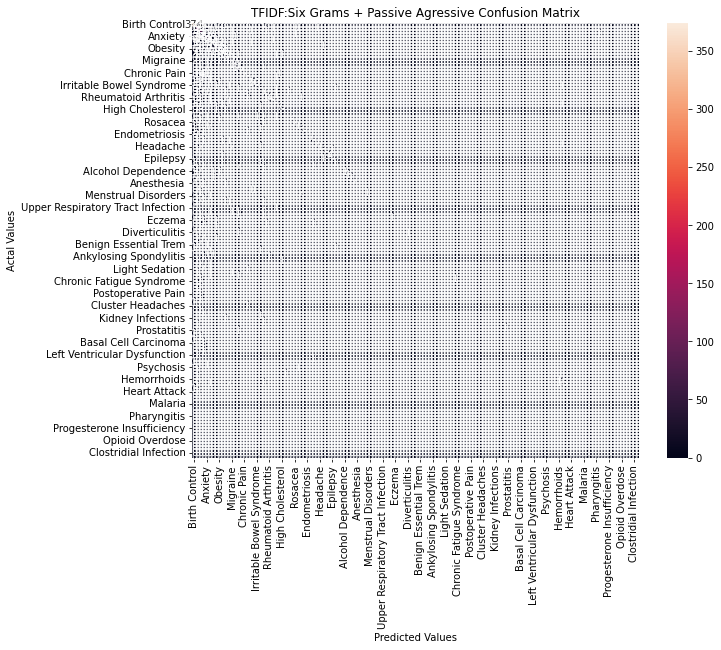

In [67]:
vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,6))
tfidf_train = vectorizer.fit_transform(Xtrain)
tfidf_test = vectorizer.transform(Xtest)

model = PassiveAggressiveClassifier()
model.fit(tfidf_train, ytrain)
pred = model.predict(tfidf_test)
train_pred=model.predict(tfidf_train)
score = metrics.accuracy_score(ytest, pred)
trainingscore=metrics.accuracy_score(train_pred, ytrain)
print("Training Accuracy :", trainingscore)
score = metrics.accuracy_score(ytest, pred)
print("Testing Accuracy :", score)

cm = metrics.confusion_matrix(ytest, pred, labels=pred_conditions)

print("--------------------TFIDF:Six Grams + Passive Agressive------------------------------")
for cls in pred_conditions:
    imp_words(vectorizer, model, cls)


print_confusion(cm, "TFIDF:Six Grams + Passive Agressive")

***As we can see most accurate model is TFIDF + Passive Aggressive Classifier ***

## Prediction

In [72]:
text =["I have Severe Anxiety Panic Disorder started when I was a child. I have been taking Xanax For over 30 years now. Everyday 4 pills really bad days I was taking 6 pills. My doctor has retired and now I have a new doctor that is cutting me off. From Taking 4 pills everyday they only gave me enough for 1/2 of a pill everyday. I'm never able to sleep I have extreme insomnia, anxiety and extreme panic attacks that plague me everyday. I was shocked at how much they cut me off and so quickly. Right now I am in critical condition. They say I had my monthly limit. I was able to function when I was given Xanax. I was able to sleep normal and eat and live a normal life. I have taken Xanax for over 30 years-long. It is truly inhumane. My body Relies on taking a medicine everyday and cutting me OFF. My body's not being able to handle the shock of the withdrawal symptoms will be really hard on my body. Some People REALLY DO NEED Xanax"]
test = vectorizer_final.transform(text)
pred=model_final.predict(test)[0]
print("Predicted", pred)

Predicted Anxiety


In [73]:
text = ['Taking this drug, for me, was taking the tiger by the tail. And I got eaten in the end. Lol, to be less dramatic, I used 300 to 600 mg gabapentin for sleep every night for fourteen months. It worked like a dream and I thought my lifelong debilitating sleep issues were over. No. It stopped working. I sleep even worse ON the drug now than I used to sleep without it. And when I don’t take it, I have complete insomnia—not even a doze all night. I know I could increase my dose and maybe be okay for another six months or another year. But I have to get off of it sometime if it’s just going to stop working periodically. I can’t increase the dose forever. I wonder how long it will take to withdrawal? I wonder if I’ll ever sleep well again? Maybe I’ll update this post or post again when I find out']
test = vectorizer_final.transform(text)
pred=model_final.predict(test)[0]
print("Predicted", pred)

Predicted Insomnia
